# Background
In this project, we use the open-source Yolov5 segmentation algorithm to first find bar-codes in product images. We then use Pyzbar as a way to read the bar code from the segmented images

## Training Yolo on barcode dataset

In [ ]:
# first train yolo on images provided of barcode

!python train.py --img 640 --epochs 3 --data bar_code.yaml --weights yolov5.pt 

## Inference on custom image

In [ ]:
# run on your own pictures. Here I just a picture of my allergy meds

!python detect.py --weights runs/train/exp2/weights/best.pt --source ~/Downloads/test.jpg 


## Run Pyzbar on custom segmented image

In [1]:
!apt install libzbar0
!pip install pyzbar

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  libv4l-0 libv4lconvert0
The following NEW packages will be installed:
  libv4l-0 libv4lconvert0 libzbar0
0 upgraded, 3 newly installed, 0 to remove and 34 not upgraded.
Need to get 238 kB of archives.
After this operation, 817 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu focal/main amd64 libv4lconvert0 amd64 1.18.0-2build1 [76.5 kB]
Get:2 http://archive.ubuntu.com/ubuntu focal/main amd64 libv4l-0 amd64 1.18.0-2build1 [41.9 kB]
Get:3 http://archive.ubuntu.com/ubuntu focal/universe amd64 libzbar0 amd64 0.23-1.3 [119 kB]
Fetched 238 kB in 1s (192 kB/s)
Selecting previously unselected package libv4lconvert0:amd64.
(Reading database ... 122542 files and directories currently installed.)
Preparing to unpack .../libv4lconvert0_1.18.0-2build1_amd64.deb ...
Unpacking libv4lconvert0:amd64 (1.18.0-2build1) ...
Se

In [2]:
import requests, json
import re
from pyzbar.pyzbar import decode
from PIL import Image

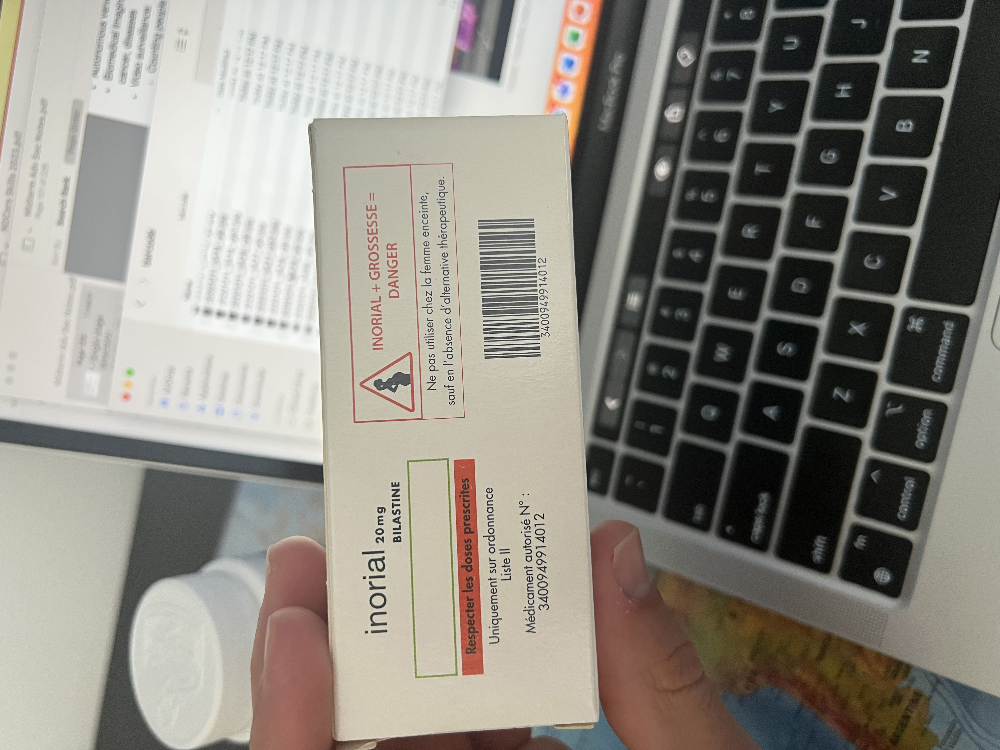

In [3]:
img_orig = Image.open('/content/drive/MyDrive/bar_code/test_original.jpg')
img_orig.show()

In [4]:
def get_barcode(image):
    """
    Read the barcode from the picture and return the barcode number in EAN 13 format
    """
    barcode = info = None
    img_raw = Image.open(image)
    img_raw.show()
    decoded = decode(img_raw)
    
    
    if decoded:
        try:
            barcode = int(re.findall("[+-]?[0-9][0-9]*|0$",
                                    str(decoded[0].data))[0])
            info = _get_product_info(barcode)
        except:
            pass

    return barcode, info

def _get_product_info(barcode):
    """
    Query a product by the barcode number the openFoodFact DB trought API 
    """
    address = "https://world.openfoodfacts.org/api/v0/product/{}.json".format(barcode)
    #print(address) use for logging
    r = requests.get(address)
    return json.loads(r.text)

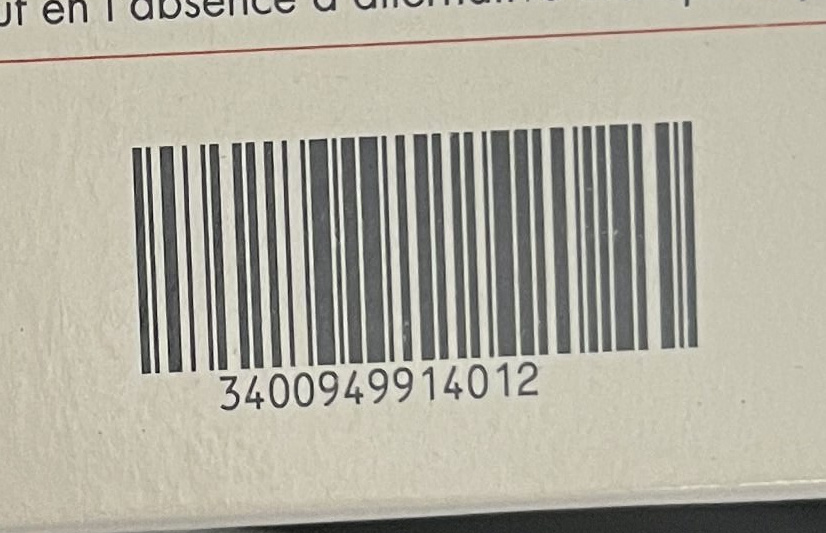

In [5]:
barcode, info =  get_barcode('/content/drive/MyDrive/bar_code/test.jpg')

In [8]:
print(barcode)

3400949914012
